In [1]:
%matplotlib inline
import time
from nd2reader import ND2Reader
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import math
import pulp
import numpy as np
from pprint import pprint
import pandas as pd
import datetime
from scipy import optimize
from scipy.ndimage.filters import maximum_filter

/var/folders/sw/37m_pmw92vn_z3tlyhsc36980000gn/T/ipykernel_4402/2925745947.py:15: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import maximum_filter


Read in the image to be processed

96 well image example.jpg


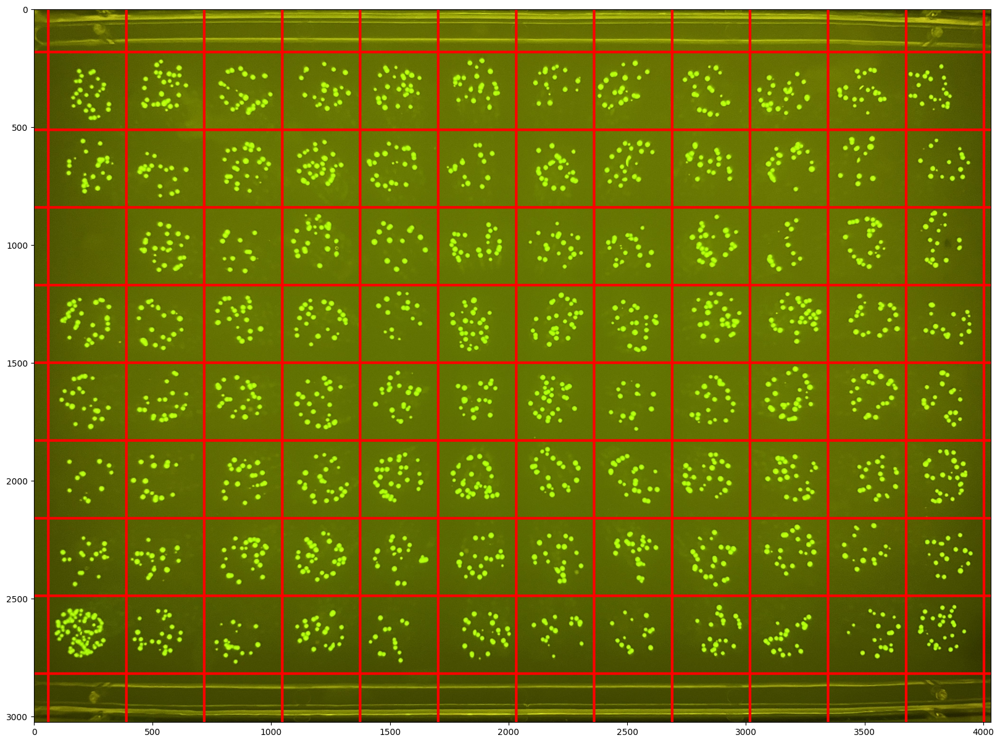

In [2]:
file_folder = 'Example'
filename = '96 well image example.jpg'
print(filename)

# Vertical axis spacing, Horizontal axis spacing, Vertical axis starting point, Horizontal axis starting point
a, b, c, d = 0.0815, 0.109, 0.015, 0.06
        
def split96_preview(filename, a, b, c, d):
    img = cv2.imread(filename)
    m, n, _ = img.shape
    
    m_points = []
    n_points = []
    
    for i in range(13):
        cv2.line(img, (int(c*n + i*a*n),1), (int(c*n + i*a*n), m), (0, 0, 255), 10)
        n_points.append(int(c*n + i*a*n))
    
    for j in range(9):
        cv2.line(img, (1,int(d*m + j*b*m)), (n, int(d*m + j*b*m)), (0, 0, 255), 10)
        m_points.append(int(d*m + j*b*m))
    
    plt.figure(figsize = (20,15))
    plt.imshow(img[...,::-1], aspect = 'auto')
    plt.show()
    return m_points, n_points
    
        
m_points, n_points = split96_preview(file_folder + "/" +filename, a, b, c, d)

Crop the image into 96 sub-images

In [3]:
def split96(path, file):
    filename = path + "/" +file
    img = cv2.imread(filename)
    if not os.path.exists(filename[:-4]):
        os.makedirs(filename[:-4])
    filename96 = []
    for i in range(12):
        for j in range(8):
            sub = img[m_points[j]:m_points[j+1], n_points[i]:n_points[i+1], :]
            cv2.imwrite(filename[:-4]+"/"+file[:-4]+"__"+chr(65+j)+str(i+1)+".jpg", sub)
            filename96.append(filename[:-4]+"/"+file[:-4]+"__"+chr(65+j)+str(i+1)+".jpg")
    print("All sub-images have been saved to " + filename[:-4])
    return filename96

filename96 = split96(file_folder, filename)

All sub-images have been saved to Example/96 well image example


Modify single sub-images

In [ ]:
# img = cv2.imread(file_folder + "/" +filename)
# j = 6 # (0~7 for 'A'~'H')
# i = 9 # (0~11 for '1'~'12')
# sub = img[m_points[j]:m_points[j+1], n_points[i]:n_points[i+1]+20, :]
# plt.imshow(sub, aspect = 'auto')
# plt.show()
# cv2.imwrite(file_folder + "/"+filename[:-4]+"/"+filename[:-4]+"__"+chr(65+j)+str(i+1)+".jpg", sub)

Apply MCount on all sub-images

In [4]:
filenames = ['96 well image example.jpg']
lam_range = [30]   # Hyperparameter: Lambda
d_t = 0.5          # Hyperparameter: d

# Find the first type of candidate circle via local maxima
def find_maxima(img):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    sub_opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=2)
    dist = cv2.distanceTransform(sub_opening, cv2.DIST_L2, 3)
    
    maxima = (dist > 0) * (dist == maximum_filter(dist, 3, mode='constant', cval=math.inf))
    res = np.where(1 == maxima)
    
    centroids = list(map(list, zip(list(res[1]), list(res[0]), list(dist[res]))))
    count = len(centroids)
    m = maxima
    return count, m, centroids, dist

# Define the distance from Point j to Line jk
def distance(cnt_i, cnt_j, cnt_k):
    x1, y1 = cnt_i[0][0], cnt_i[0][1]
    line_start_x, line_start_y = cnt_j[0][0], cnt_j[0][1]
    x2, y2 = cnt_k[0][0], cnt_k[0][1]
    array_longi = np.array([x2-x1, y2-y1])
    array_trans = np.array([x2-line_start_x, y2-line_start_y])
    array_temp = (float(array_trans.dot(array_longi)) / array_longi.dot(array_longi))
    array_temp = array_longi.dot(array_temp)
    return np.sqrt((array_trans - array_temp).dot(array_trans - array_temp))

def clockwise_angle(v1, v2):
    x1, y1 = v1
    x2, y2 = v2
    dot = x1*x2+y1*y2
    det = x1*y2-x2*y1
    theta = np.arctan2(det, dot)
    return theta

# Calculate the distance of each 2D points from the center (xc, yc)
def calc_R(x,y, xc, yc):
    return np.sqrt((x-xc)**2 + (y-yc)**2)

# Calculate the algebraic distance between the data points and the mean circle centered at c=(xc, yc)
def f(c, x, y):
    Ri = calc_R(x, y, *c)
    return Ri - Ri.mean()

# Find the second type of candidate circle via least square fitting
def leastsq_circle(x,y):
    x_m = np.mean(x)
    y_m = np.mean(y)
    center_estimate = x_m, y_m
    center, ier = optimize.leastsq(f, center_estimate, args=(x,y))
    xc, yc = center
    Ri       = calc_R(x, y, *center)
    R        = Ri.mean()
    residu   = np.sum((Ri - R)**2)
    return int(xc), int(yc), R, residu


def seg_counting(labels, xxxxxx, img, lam):
    img_c = np.uint8(255*(labels==xxxxxx))
    count, m, centroids, dist = find_maxima(np.uint8(img_c))
    contours, h = cv2.findContours(img_c,cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    contours_split = []
    for cnt in contours:
        turning_points = [cnt[0]]
        i, k = 0, 2
        while k < len(cnt):
            d_max, ind = 0, 0
            for j in range(i+1, k):
                d = distance(cnt[i], cnt[j], cnt[k])
                if d > d_max:
                    d_max = d
                    ind = j
            if d_max > d_t:
                turning_points = np.append(turning_points, [cnt[ind]], axis=0)
                i, k = ind, ind+2
            else:
                k = k + 1

        angles = []
        concave_points = [turning_points[0]]

        for i in range(len(turning_points)-2):
            angles.append(clockwise_angle([turning_points[i+1][0][0]-turning_points[i][0][0], turning_points[i+1][0][1]-turning_points[i][0][1]], [turning_points[i+2][0][0]-turning_points[i+1][0][0], turning_points[i+2][0][1]-turning_points[i+1][0][1]])/math.pi*180)
            if angles[-1] > 0:
                concave_points = np.append(concave_points, [turning_points[i+1]], axis=0)

        index = []
        k = 0

        for i in range(len(cnt)):
            x, y = concave_points[k][0][0], concave_points[k][0][1]
            x_now, y_now = cnt[i][0][0], cnt[i][0][1]
            if x==x_now and y==y_now:
                index.append(i)
                k = k+1
            if k == len(concave_points):
                break

        if contours_split == []:
            contours_split = [[cnt[index[x]:index[x+1]]] for x in range(len(index)-1)]
        else:
            contours_split = contours_split + [[cnt[index[x]:index[x+1]]] for x in range(len(index)-1)]
        contours_split.append([cnt[index[-1]:]])

    for ss in range(len(contours_split)):
        x = [i[0][0] for i in contours_split[ss][0]]
        y = [i[0][1] for i in contours_split[ss][0]]
        if len(x) <= 3:
            continue
        xc, yc, _, _ = leastsq_circle(x,y)
        y_max, x_max = m.shape
        if yc < y_max and yc >= 0 and xc < x_max and xc>= 0:
            if img_c[yc][xc] > 0 and dist[yc][xc] > 0:
                count = count + 1 - int(m[yc][xc])
                m[yc][xc] = 1
                centroids.append((xc, yc, dist[yc][xc]))
        
    # d[i][j] defines the distance from Contour i to Candidate circle j
    d = np.zeros((len(contours_split), count))
    dd = [math.inf for i in contours_split]
    index_d = [-1 for i in contours_split]
    for i in range(len(contours_split)):
        for j in range(count):
            for z in range(len(contours_split[i][0])):
                d[i][j] = d[i][j] + abs(math.dist([contours_split[i][0][z][0][0], contours_split[i][0][z][0][1]], [centroids[j][0], centroids[j][1]]) - centroids[j][2])
            if dd[i] > d[i][j]:
                dd[i] = d[i][j]
                index_d[i] = j
    
    # Solve the optimization problem
    d = np.array(d)
    prob = pulp.LpProblem('contour_mapping', sense=pulp.LpMinimize)
    var_x = [[pulp.LpVariable('x{:5d}{:5d}'.format(i, j), cat=pulp.LpBinary) for j in range(count)] for i in range(len(contours_split))]
    flatten = lambda x: [y for l in x for y in flatten(l)] if type(x) is list else [x]
    var_z = [pulp.LpVariable('z{:5d}'.format(j), cat=pulp.LpBinary) for j in range(count)]
    prob += pulp.lpDot(flatten(var_x)+var_z, np.append(d.flatten(), [lam for j in range(count)]))
    for i in range(len(contours_split)):
        prob += (pulp.lpSum(var_x[i]) == 1)
    for j in range(count):
        prob += (pulp.lpSum([var_x[i][j] for i in range(len(contours_split))] + [-var_z[j]]) >= 0)
        prob += (pulp.lpSum([var_x[i][j] for i in range(len(contours_split))] + [-len(contours_split)*var_z[j]]) <= 0)

    # Solver is COIN_CMD
    prob.solve(solver = pulp.getSolver('PULP_CBC_CMD'))

    res = {'objective':pulp.value(prob.objective), 'var_x': [[pulp.value(var_x[i][j]) for j in range(count)] for i in range(len(contours_split))], 'var_z': [pulp.value(var_z[j]) for j in range(count)]}

    final_img = np.uint8(img)
    img_seg = np.uint8(img*np.array([(labels==xxxxxx),(labels==xxxxxx),(labels==xxxxxx)]).transpose(1, 2, 0))
    for i in range(count):
        if res['var_z'][i]:
            img = cv2.circle(final_img, (centroids[i][0], centroids[i][1]), int(centroids[i][2]), (0, 0, 255), 1)
            img_seg = cv2.circle(img_seg, (centroids[i][0], centroids[i][1]), int(centroids[i][2]), (0, 0, 255), 1)
    
    return int(sum(res['var_z'])), final_img, img_seg

for lam in lam_range:
    for filename in filenames:
        if not os.path.exists(file_folder + "/" +filename[:-4] + "/" + str(lam) + "_segmentations"):
            os.makedirs(file_folder + "/" +filename[:-4] + "/" + str(lam) + "_segmentations")
        if not os.path.exists(file_folder + "/" +filename[:-4] + "/" + str(lam)):
            os.makedirs(file_folder + "/" +filename[:-4] + "/" + str(lam))
            
        img = cv2.imread(file_folder + "/" +filename)
        img = img[m_points[0]:m_points[8], n_points[0]:n_points[12], :]
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, _ = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU)

        filename_sub = []
        for file in os.listdir(file_folder + "/" +filename[:-4]):
            if file.endswith('jpg') or file.endswith('JPG'):
                filename_sub.append(file)

        filename_sub.sort(key = lambda x: (x.split("__")[1][0], int(x.split("__")[1][1:-4])))
        
        df = pd.DataFrame(columns=['filename_seg', 'counted'])
        
        for file in filename_sub:
            img = cv2.imread(file_folder + "/" +filename[:-4] + "/" + file)
            img = img.copy()
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            _, thresh = cv2.threshold(gray, ret, 255, cv2.THRESH_BINARY)
            num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(thresh)
            
            if num_labels == 1:
                img_c = np.uint8(np.array([(labels==0),(labels==0),(labels==0)]).transpose(1, 2, 0))
                cv2.imwrite(file_folder + "/" +filename[:-4] + "/" + str(lam) +  "_segmentations" + "/" + file[:-4] + "__" + str(0) + ".jpg", img_c)
                cv2.imwrite(file_folder + "/" +filename[:-4] + "/" + str(lam) + "/" + file, img)
                df.loc[len(df)] = {'filename_seg':file[:-4] + "__" + str(0) + ".jpg", 'counted':0}
            
            for xxxxxx in range(1, num_labels):
                counted_cell_number, img, img_seg = seg_counting(labels, xxxxxx, img, lam)
    
                
                df.loc[len(df)] = {'filename_seg':file[:-4] + "__" + str(xxxxxx) + ".jpg", 'counted':counted_cell_number}
                cv2.imwrite(file_folder + "/" +filename[:-4] + "/" + str(lam) + "_segmentations" + "/" + file[:-4] + "__" + str(xxxxxx) + ".jpg", img_seg)
            
            cv2.imwrite(file_folder + "/" +filename[:-4] + "/" + str(lam) + "/" + file, img)
        df.to_csv(file_folder + "/" +filename[:-4] + "/" + str(lam) + ".csv")
        
        df['row_#'] = df.filename_seg.apply(lambda x: x.split("__")[1][0])
        df['column_#'] = df.filename_seg.apply(lambda x: x.split("__")[1][1:])
        df['column_#'] = df['column_#'].astype("int")
        df = pd.DataFrame(df.groupby(['row_#', 'column_#']).sum()).reset_index()
        df = pd.pivot_table(df, values='counted', index=['row_#'], columns=['column_#'], aggfunc=np.sum)
        df.to_csv(file_folder + "/" +filename[:-4] + ".csv")

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Users/hk/miniconda3/lib/python3.10/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/sw/37m_pmw92vn_z3tlyhsc36980000gn/T/482d4bbda11b4520b9f6fe29657f60a1-pulp.mps timeMode elapsed branch printingOptions all solution /var/folders/sw/37m_pmw92vn_z3tlyhsc36980000gn/T/482d4bbda11b4520b9f6fe29657f60a1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 19 COLUMNS
At line 165 RHS
At line 180 BOUNDS
At line 206 ENDATA
Problem MODEL has 14 rows, 25 columns and 70 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 45.1569 - 0.00 seconds
Cgl0004I processed model has 14 rows, 25 columns (25 integer (25 of which binary)) and 70 elements
Cbc0038I Initial state - 4 integers unsatisfied sum - 1
Cbc0038I Pass   1: suminf.    1.00000 (4) obj. 45.1569 iterations 1
Cbc0038I Solution found of 135.157
Cbc0038I

/var/folders/sw/37m_pmw92vn_z3tlyhsc36980000gn/T/ipykernel_4402/1477821554.py:26: RuntimeWarning: invalid value encountered in divide
  array_temp = (float(array_trans.dot(array_longi)) / array_longi.dot(array_longi))


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Users/hk/miniconda3/lib/python3.10/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/sw/37m_pmw92vn_z3tlyhsc36980000gn/T/c4fc7d3391b5455f9af735d53a32f218-pulp.mps timeMode elapsed branch printingOptions all solution /var/folders/sw/37m_pmw92vn_z3tlyhsc36980000gn/T/c4fc7d3391b5455f9af735d53a32f218-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 14 COLUMNS
At line 84 RHS
At line 94 BOUNDS
At line 107 ENDATA
Problem MODEL has 9 rows, 12 columns and 33 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 53.3122 - 0.00 seconds
Cgl0004I processed model has 9 rows, 12 columns (12 integer (12 of which binary)) and 33 elements
Cbc0038I Initial state - 2 integers unsatisfied sum - 0.666667
Cbc0038I Pass   1: suminf.    0.33333 (1) obj. 63.3122 iterations 3
Cbc0038I Solution found of 83.3122
Cbc00

In [ ]:
solver_list = pulp.listSolvers(onlyAvailable=True)
solver_list
# ['GLPK_CMD', 'CPLEX_CMD', 'CPLEX_PY', 'GUROBI', 'GUROBI_CMD', 'PULP_CBC_CMD', 'COIN_CMD']

In [ ]:
seg_counting(labels, xxxxxx, img, lam)

Read in the counting results of all segments and calculate the counting results of sub-images

In [5]:
filenames = ['96 well image example.jpg']
lam_range = [30]
df = pd.read_csv(file_folder + "/" +filename[:-4] + "/" + str(lam) + ".csv")
df['row_#'] = df.filename_seg.apply(lambda x: x.split("__")[1][0])
df['column_#'] = df.filename_seg.apply(lambda x: x.split("__")[1][1:])
df['column_#'] = df['column_#'].astype("int")
df = pd.DataFrame(df.groupby(['row_#', 'column_#']).sum()).reset_index()
df = pd.pivot_table(df, values='counted', index=['row_#'], columns=['column_#'], aggfunc=np.sum)
df.to_csv(file_folder + "/" +filename[:-4] + ".csv")
print(df)

column_#  1   2   3   4   5   6   7   8   9   10  11  12
row_#                                                   
A         27  28  26  21  26  27  17  22  20  22  22  22
B         23  18  27  28  23  16  25  24  20  21  13  15
C          0  28  12  23  14  25  18  19  27  14  25  19
D         30  21  21  25  15  29  27  23  27  29  22  18
E         23  22  24  26  22  18  27  13  22  28  23  19
F         11  16  21  24  29  30  23  22  25  23  19  28
G         18  19  24  30  18  19  19  23  23  21  16  18
H         66  24  19  23  14  25  17  15  22  21  18  26
